In [1]:
from IPython.display import Javascript, display

js_code = """
if (typeof Jupyter !== "undefined" && Jupyter.notebook) {
    Jupyter.OutputArea.prototype._should_scroll = function(lines) {
        return false;
    };
} else if (typeof IPython !== "undefined") {
    IPython.OutputArea.prototype._should_scroll = function(lines) {
        return false;
    };
} else {
    console.warn("Neither Jupyter nor IPython object is available.");
}
"""
display(Javascript(js_code))


<IPython.core.display.Javascript object>

In this peroject, you will create a deep learning model that detects the TNt tubes formed in between cells. Below is a berief decsripton of what TNTs are:

"Tunneling nanotubes (TNTs) are elongated structures extending from and connecting cancer cell membranes. They permit the exchange of molecules, vesicles, and mitochondria, as well as genetic and metabolic signals that promote carcinogenesis. Given that they permit intercellular trafficking and communication, TNTs may serve as an important imaging biomarker of cancer cell response vs. resistance to therapy. On fluorescence imaging of cancer cell cultures, TNTs appear to be no thicker than 1 µm and vary in length from 10 to 100+ µm. TNTs can be spotted by a trained eye, but using human experts to obtain an accurate count and location of TNTs is a time-intensive process. A precise quantitative analysis of TNTs could aid in the objective assessment of cancer response to various therapeutic interventions."

In this project, the original images were created by taking a grid of 5 × 5 tiled images, each measuring 1388 × 1040 pixels, and then stitching them together. This process resulted in shadows along the stitched edges, which significantly degraded the model performance at later stages. You may start from removing these shadows. To remove those shadows, you may use BaSiC, an image correction method for background and shading correction for image sequences, available as a Fiji/ImageJ. You may consider other packages/lobraries for this purpose. You may also consider using different filters. You may check the following link: https://www.youtube.com/watch?v=xCHbcVUCYBI. You may find very useful short videos in that channel for image processing.

After preprocessing, you may want to divide the original image into smaller pieces. The original image in the training dataset was stitched together resulting in an image - size of 6283 × 4687 pixels. You can scan the images  with a sliding window of 512 × 512 pixels with a stride of 10 pixels, extracting patches containing the TNT regions using a bounding box. You may write a function that takes the window size as input. You may later create smaller images from 512x512 images using the same function.

Once you form training and test datasets from smaller images, you may simply train a VGG model. You may try different models. you goal is to find the images that contain TNTs. You may create multiple models that are trained with images with different sizes. 

# Image Preprocessing

This is the image with labels

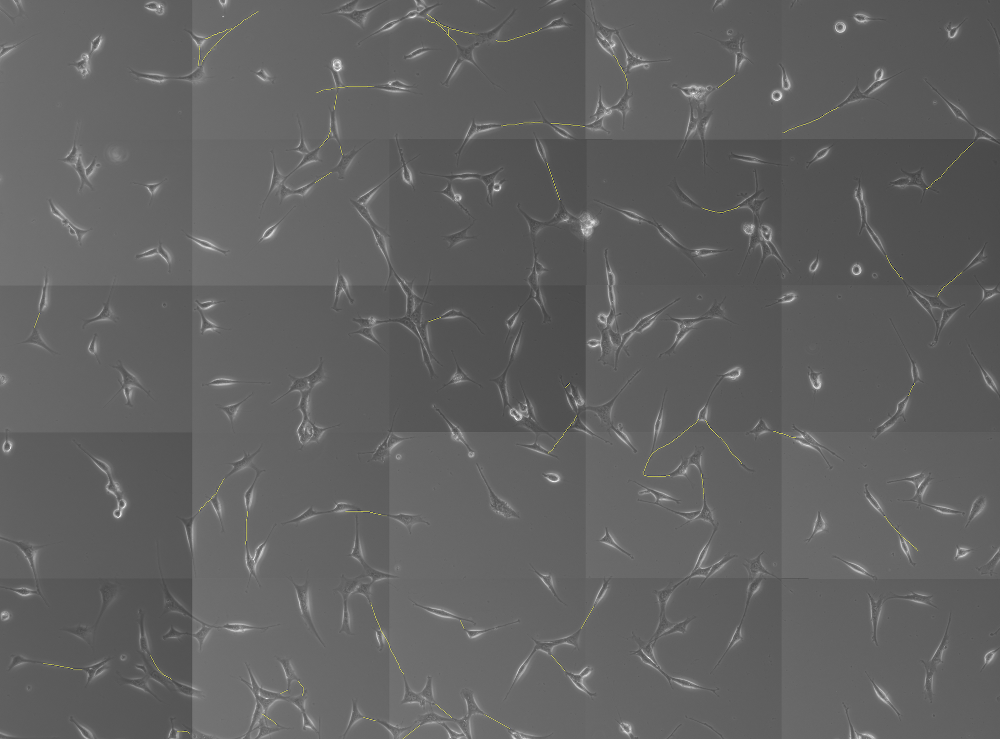

This is the same image without labels.

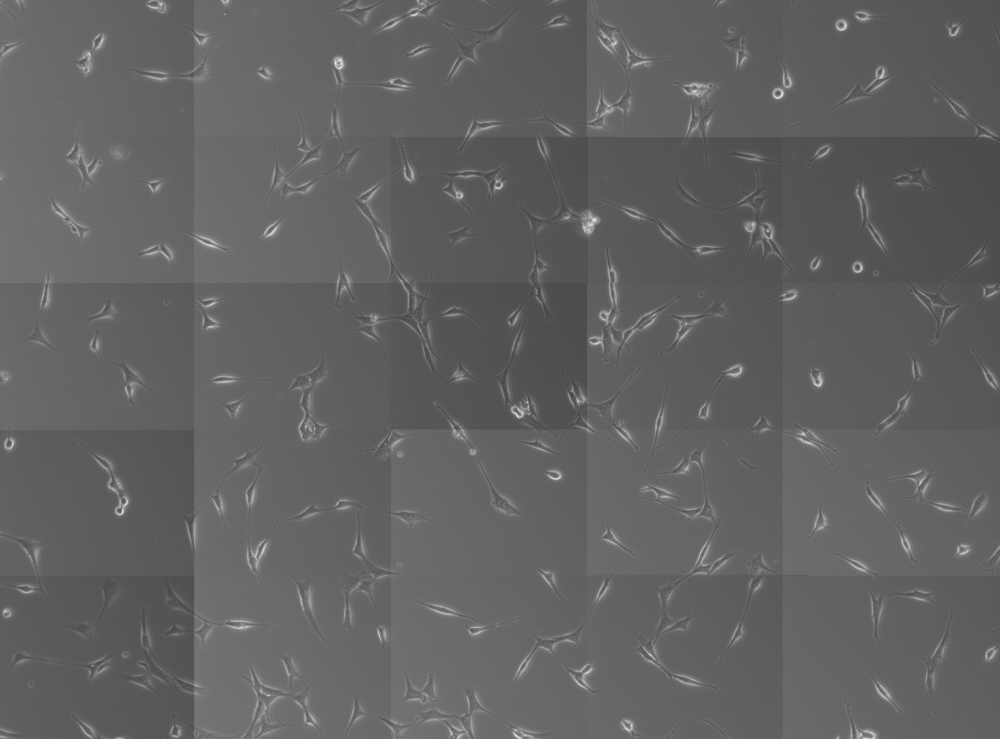

In [2]:
# Imports and GPU Startup
import os
# Remove any existing LD_LIBRARY_PATH to avoid conflicts
os.environ["LD_LIBRARY_PATH"] = "/usr/lib/x86_64-linux-gnu:/usr/local/cuda-12.5/lib64"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
os.environ["CUDA_HOME"] = "/usr/local/cuda-12.5"

import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)
        
import numpy as np
import pandas as pd 
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.utils import to_categorical
import tensorflow_addons as tfa
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import glob
from PIL import Image
        
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("TensorFlow version:", tf.__version__)
print("Built with CUDA:", tf.test.is_built_with_cuda())
print("GPU Device Name:", tf.test.gpu_device_name())
print("List of GPUs:", tf.config.list_physical_devices('GPU'))

2025-03-12 16:03:39.032016: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-12 16:03:39.042830: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741820619.055154   26014 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741820619.058952   26014 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-12 16:03:39.072658: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

Num GPUs Available:  1
TensorFlow version: 2.18.0
Built with CUDA: True
GPU Device Name: /device:GPU:0
List of GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


/home/oem/Documents/github/magnimind_projects/magpenv/lib/python3.12/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/home/oem/Documents/github/magnimind_projects/magpenv/lib/python3.12/site-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.18.0 and is not supported. 
Some things might work, some things might not.
I

- Create folders to save the images that are created by splitting the main image into smaller pieces


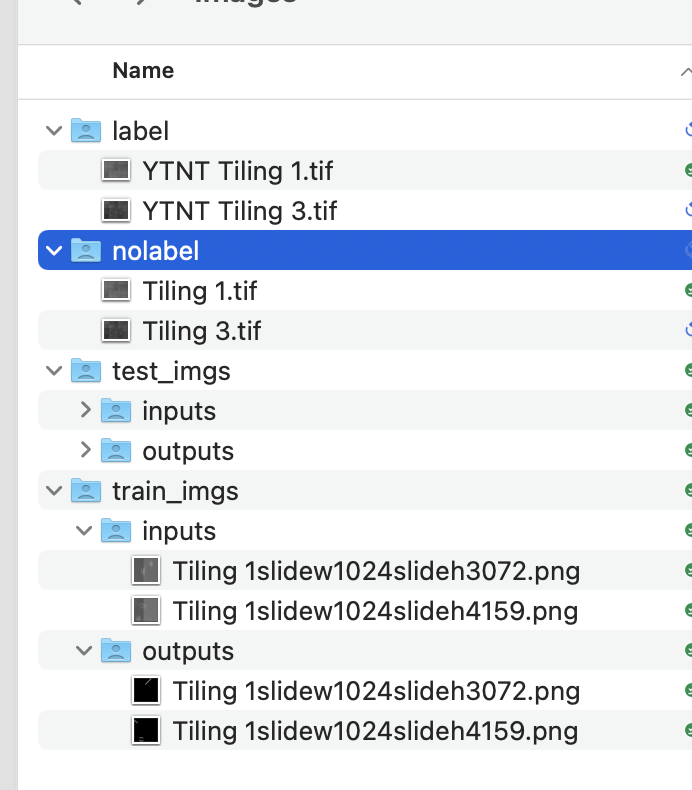

- Create smaller pieces from the main image by moving a window along the image. Mark the pieces with TNTs as 1 and all others as 0. This will give you the labeled images for your classification model.

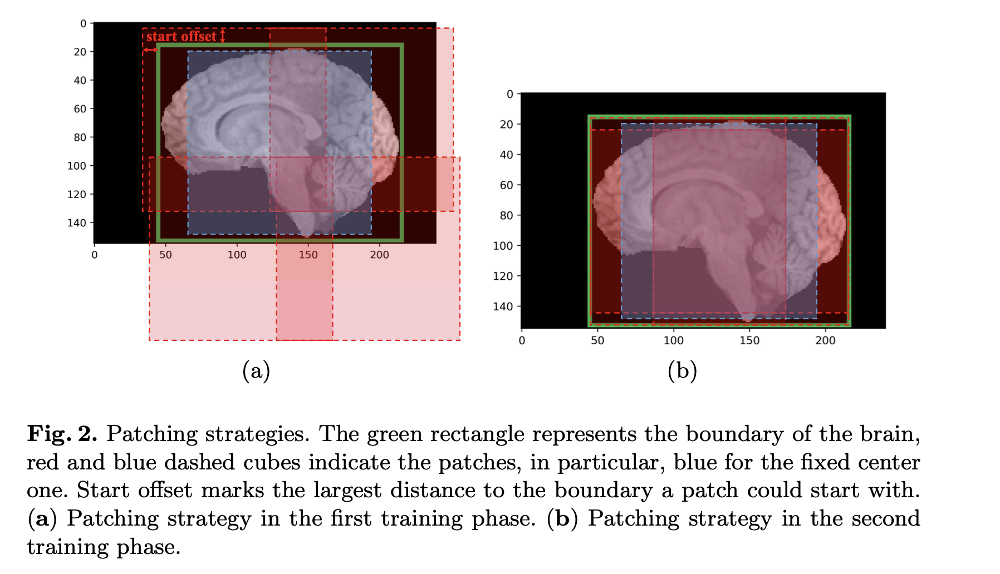

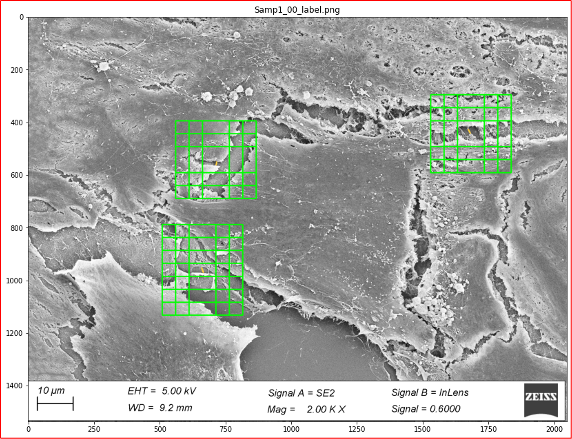

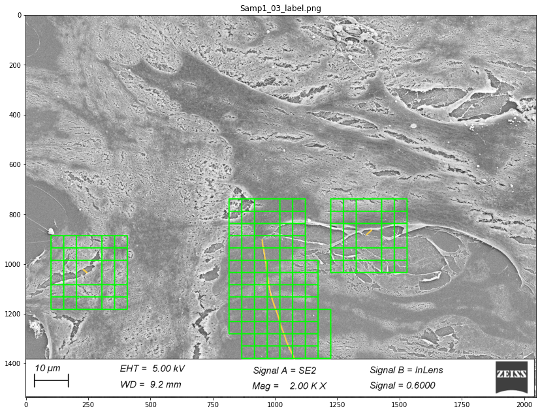

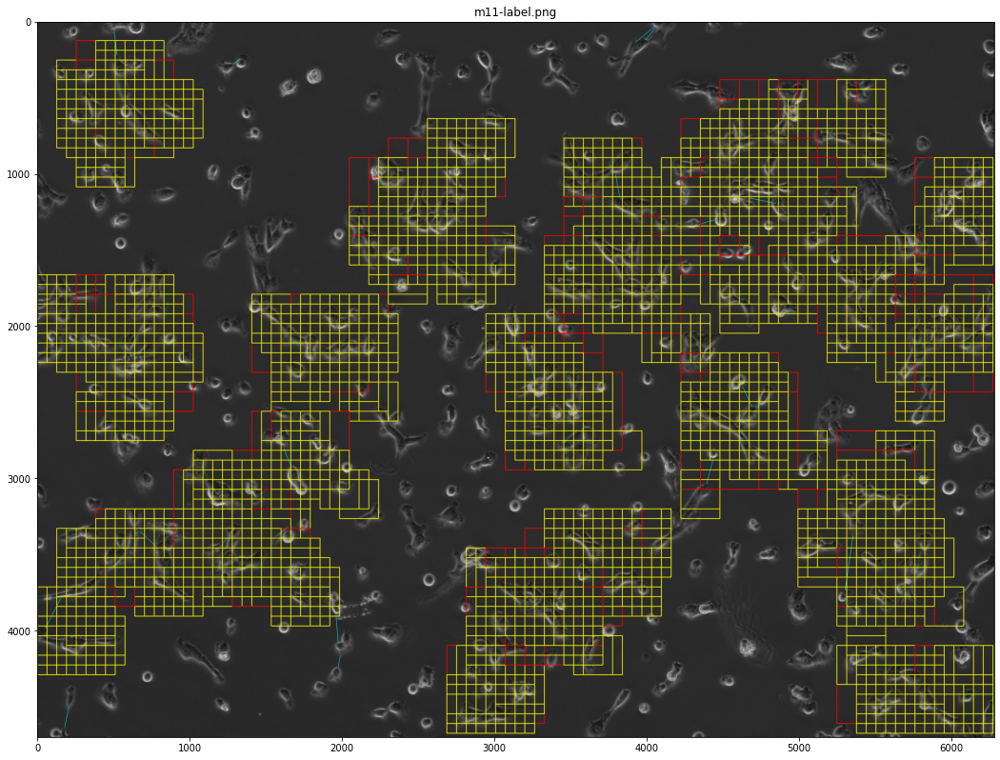

### A closer look at Images

In [3]:
import os
import cv2
import numpy as np
import glob

# Create output directories if they don't exist
os.makedirs('./data/tnt/nolabel', exist_ok=True)
os.makedirs('./data/tnt/label', exist_ok=True)

# Load the original images
image_nolabel = cv2.imread('./data/tnt/m05.png')
image_label = cv2.imread('./data/tnt/m05-label.png')

if image_nolabel is None or image_label is None:
    raise IOError("One or both input images could not be loaded.")

# Get image dimensions (expected around 4690x6278 pixels)
height, width, _ = image_nolabel.shape
print(f'height: {height}')
print(f'width: {width}')

height: 4690
width: 6278


In [4]:
# Get image dimensions (expected around 4690x6278 pixels)
height, width, _ = image_label.shape
print(f'height: {height}')
print(f'width: {width}')

height: 4690
width: 6278


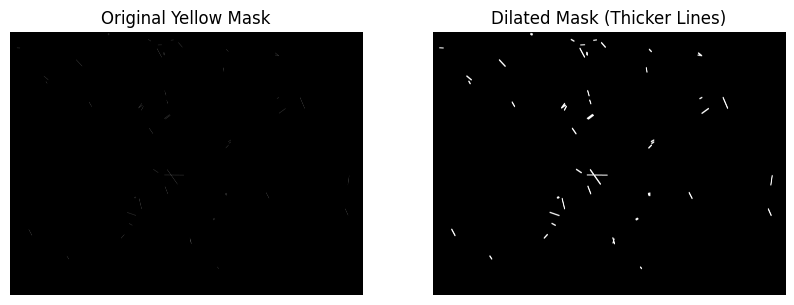

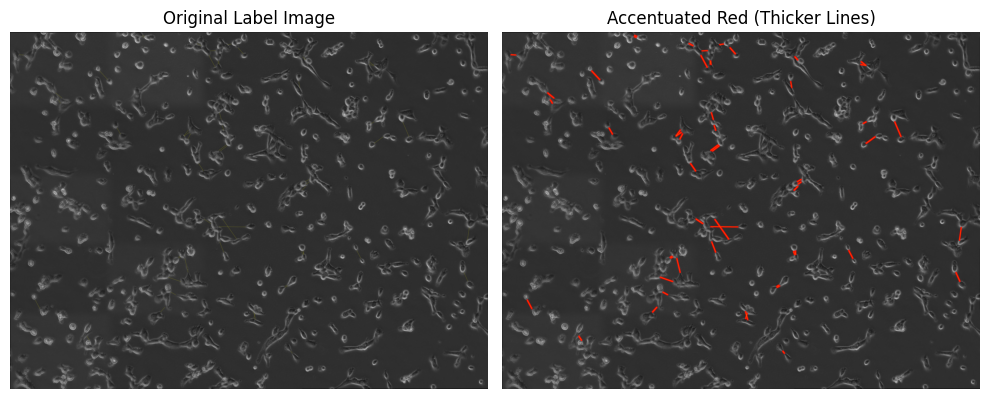

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the label image
image_label = cv2.imread('./data/tnt/m05-label.png')
if image_label is None:
    raise IOError("Input image could not be loaded.")

# Convert from BGR to HSV
image_label_hsv = cv2.cvtColor(image_label, cv2.COLOR_BGR2HSV)

# Define a broad hue range for yellow
lower_yellow = np.array([15, 50, 50])
upper_yellow = np.array([35, 255, 255])

# Create a mask of all yellow pixels
mask_yellow = cv2.inRange(image_label_hsv, lower_yellow, upper_yellow)

# DILATE the mask to make lines thicker.
# Increase kernel size or iterations to make lines thicker.
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 9))
mask_yellow_dilated = cv2.dilate(mask_yellow, kernel, iterations=2)

# Display original vs. dilated mask to see the difference
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(mask_yellow, cmap='gray')
plt.title("Original Yellow Mask")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(mask_yellow_dilated, cmap='gray')
plt.title("Dilated Mask (Thicker Lines)")
plt.axis('off')

plt.show()

# Increase saturation and value for these *dilated* yellow pixels
image_label_hsv[..., 1] = np.where(mask_yellow_dilated > 0, 255, image_label_hsv[..., 1])  # Saturation
image_label_hsv[..., 2] = np.where(mask_yellow_dilated > 0, 255, image_label_hsv[..., 2])  # Value

# Convert back to BGR, then to RGB for plotting
accentuated_bgr = cv2.cvtColor(image_label_hsv, cv2.COLOR_HSV2BGR)
accentuated_rgb = cv2.cvtColor(accentuated_bgr, cv2.COLOR_BGR2RGB)
original_rgb = cv2.cvtColor(image_label, cv2.COLOR_BGR2RGB)

# Show side by side in the notebook
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.title('Original Label Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(accentuated_rgb)
plt.title('Accentuated Red (Thicker Lines)')
plt.axis('off')

plt.tight_layout()
plt.show()


In [6]:
pixel_count = np.count_nonzero(mask_yellow_dilated)
print(f"Number of accentuated pixels: {pixel_count}")
print(f"Total Number of Pixels: {height*width}")
print(f"Percent accentuated Pixels: {pixel_count / (height*width)}")

Number of accentuated pixels: 128257
Total Number of Pixels: 29443820
Percent accentuated Pixels: 0.0043559904930814


In [7]:
import cv2
import numpy as np
import os

# Define your filtering functions
def remove_shadows_color(image, kernel_size=(9,9)):
    """
    Remove shadows from an RGB image by processing the V channel in HSV.
    This function preserves hue and saturation.
    """
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)
    background = cv2.morphologyEx(v, cv2.MORPH_OPEN, kernel, iterations=1)
    diff = cv2.subtract(v, background)
    norm = cv2.normalize(diff, None, alpha=0.11, beta=175,
                           norm_type=cv2.NORM_L2, dtype=cv2.CV_8U)
    alpha = 0.11  # blend factor between 0.0 (no correction) and 1.0 (full)
    v_corrected = cv2.addWeighted(v, 1 - alpha, norm, alpha, 0)
    hsv_corrected = cv2.merge([h, s, v_corrected])
    corrected_rgb = cv2.cvtColor(hsv_corrected, cv2.COLOR_HSV2RGB)
    return corrected_rgb

# Directories for saving tiles
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'
os.makedirs(nolabel_dir, exist_ok=True)
os.makedirs(label_dir, exist_ok=True)

# Load the full stitched images
image_nolabel = cv2.imread('./data/tnt/m05.png')  # Original no-label image
image_label   = cv2.imread('./data/tnt/m05-label.png')  # Label image with yellow lines

if image_nolabel is None or image_label is None:
    print("Error loading stitched images.")
    exit(1)

# Get the dimensions of the full images
height, width = image_nolabel.shape[:2]

# Define grid size for splitting (adjust rows and cols as needed)
rows, cols = 25, 25
tile_width = width // cols
tile_height = height // rows

tile_num = 1
for i in range(rows):
    for j in range(cols):
        # Calculate the top-left corner for the tile
        x = j * tile_width
        y = i * tile_height

        # Crop the tile from the no-label image
        tile_nolabel = image_nolabel[y:y + tile_height, x:x + tile_width]
        # Crop the tile from the label image
        tile_label = image_label[y:y + tile_height, x:x + tile_width]

        # ----------------------- Apply Filtering -----------------------
        # For the no-label tile:
        # Convert from BGR to RGB for filtering
        tile_nolabel_rgb = cv2.cvtColor(tile_nolabel, cv2.COLOR_BGR2RGB)
        # Remove shadows from the tile
        tile_nolabel_filtered_rgb = remove_shadows_color(tile_nolabel_rgb, kernel_size=(9, 9))
        # Convert back to BGR for saving
        tile_nolabel_filtered = cv2.cvtColor(tile_nolabel_filtered_rgb, cv2.COLOR_RGB2BGR)

        # For the label tile:
        # Convert from BGR to RGB
        tile_label_rgb = cv2.cvtColor(tile_label, cv2.COLOR_BGR2RGB)
        # Remove shadows only (do not accentuate yellow here)
        tile_label_filtered_rgb = remove_shadows_color(tile_label_rgb, kernel_size=(9, 9))
        # Convert back to BGR for further processing
        tile_label_filtered = cv2.cvtColor(tile_label_filtered_rgb, cv2.COLOR_RGB2BGR)
        # Convert the filtered label tile to HSV and extract the yellow mask.
        hsv_tile = cv2.cvtColor(tile_label_filtered, cv2.COLOR_BGR2HSV)
        # Define the HSV range for yellow (adjust these values as needed)
        lower_yellow = np.array([20, 100, 100])
        upper_yellow = np.array([30, 255, 255])
        mask = cv2.inRange(hsv_tile, lower_yellow, upper_yellow)
        
        # -------------------- Apply Dilation to Accentuate Nanotubes --------------------
        # Increase the kernel size and iterations for a more pronounced dilation effect
        dilation_kernel = np.ones((5, 5), np.uint8)
        mask_dilated = cv2.dilate(mask, dilation_kernel, iterations=2)
        binary_mask = mask_dilated
        # ------------------------------------------------------------------------------

        # Define file names for the tiles
        nolabel_filename = os.path.join(nolabel_dir, f'tnt_tile{tile_num}.tif')
        label_filename   = os.path.join(label_dir, f'ytnt_tile{tile_num}.tif')

        # Save the processed tiles
        cv2.imwrite(nolabel_filename, tile_nolabel_filtered)
        cv2.imwrite(label_filename, binary_mask)

        tile_num += 1

print(f"Saved {tile_num - 1} tiles in both the 'nolabel' and 'label' directories.")


Saved 625 tiles in both the 'nolabel' and 'label' directories.


Total samples available: 625


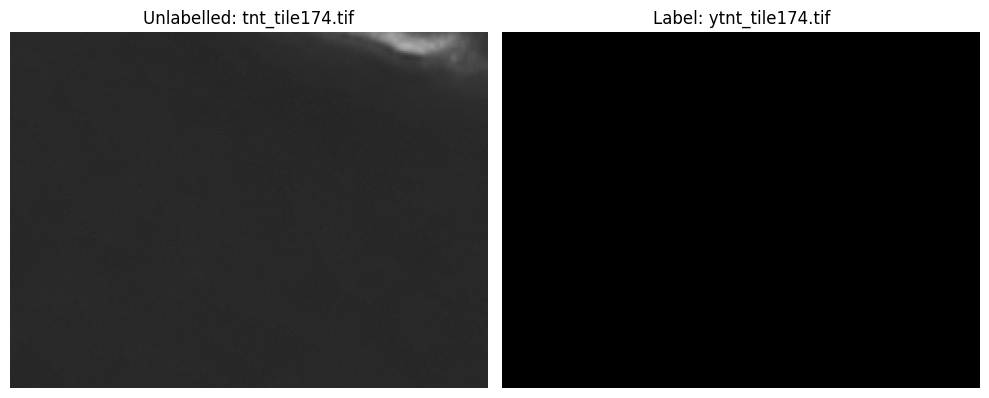

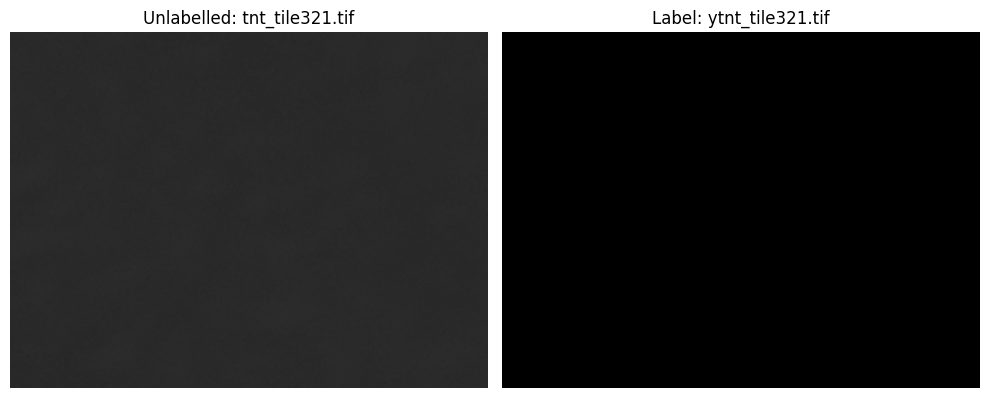

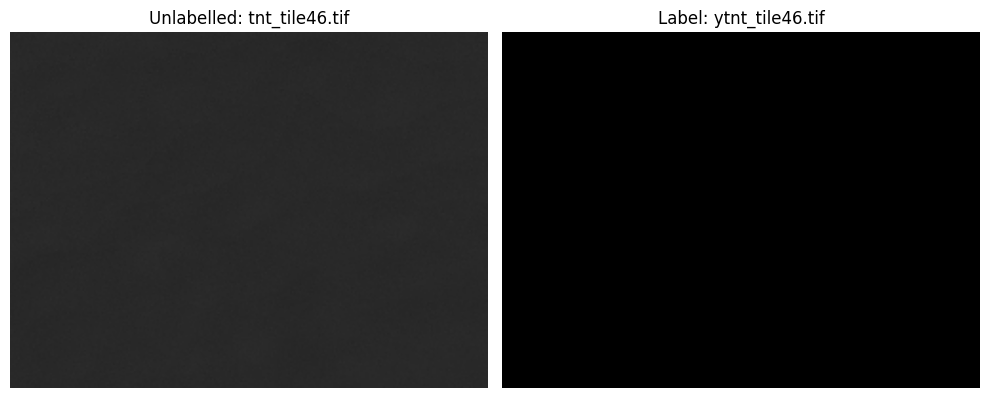

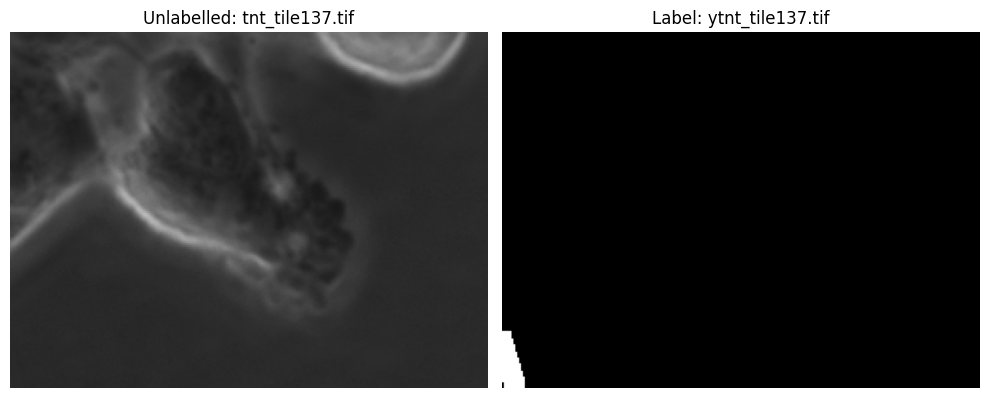

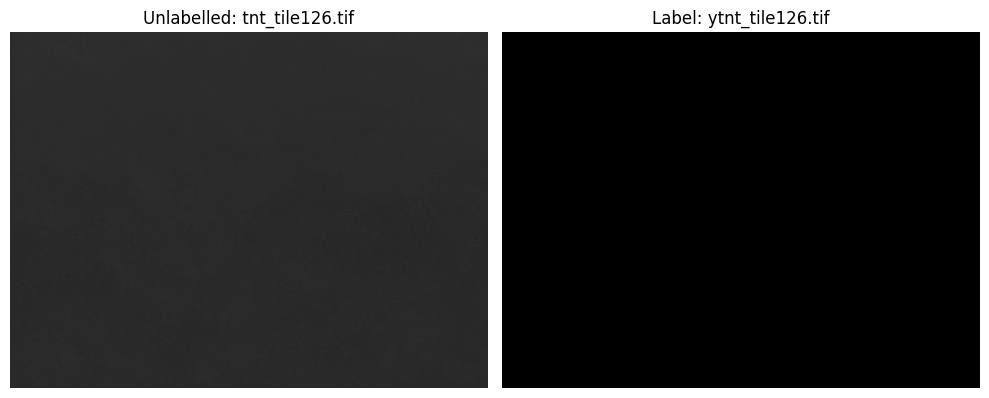

...

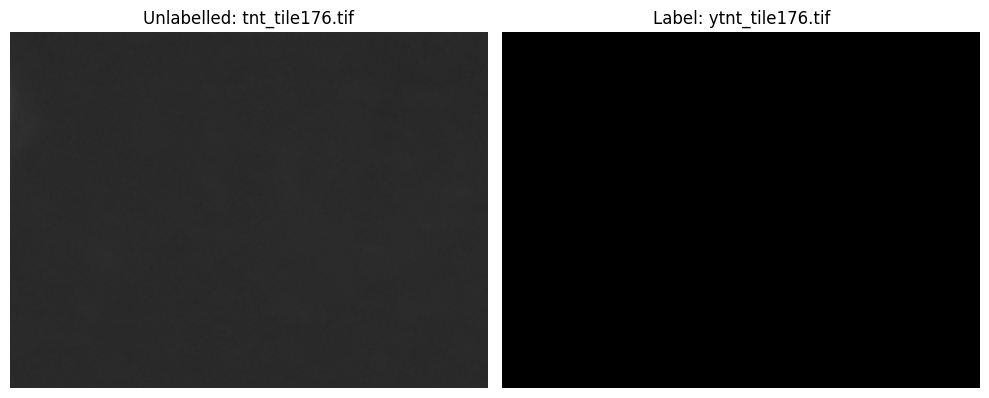

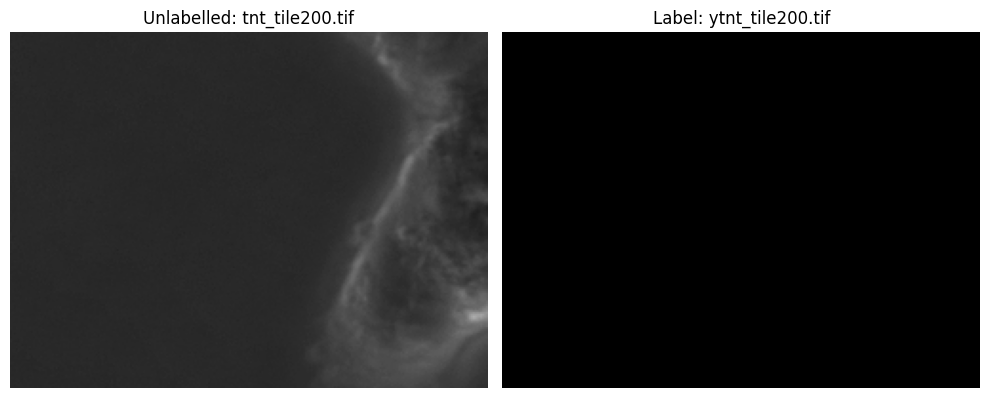

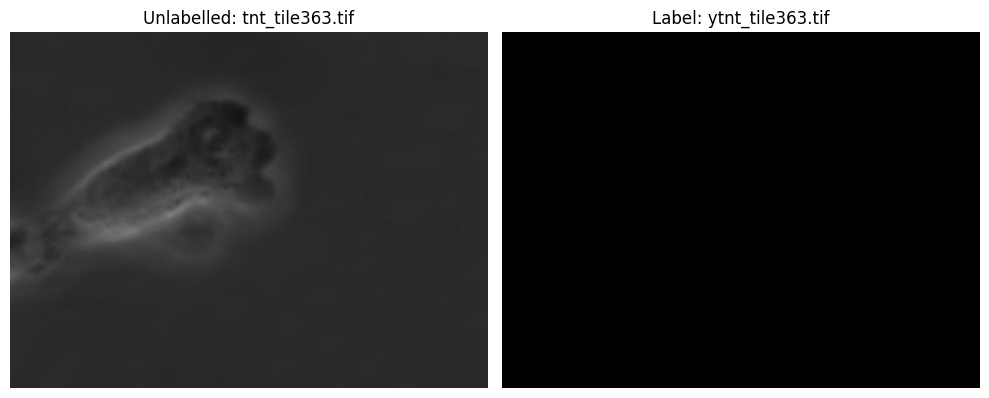

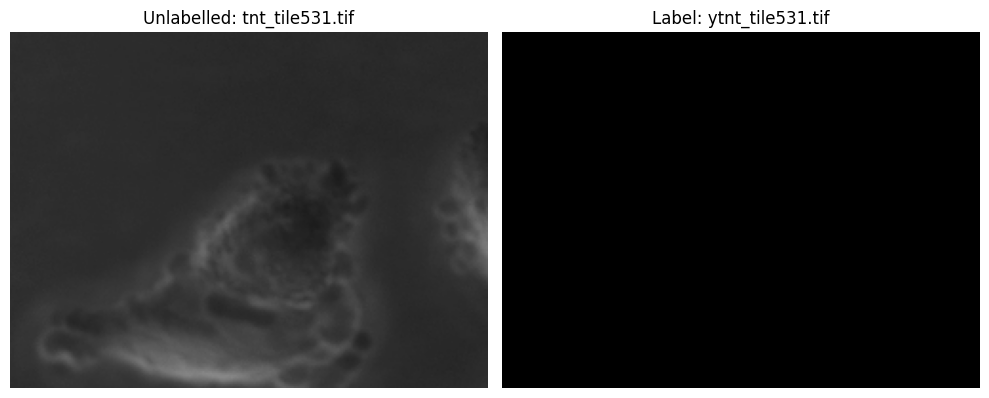

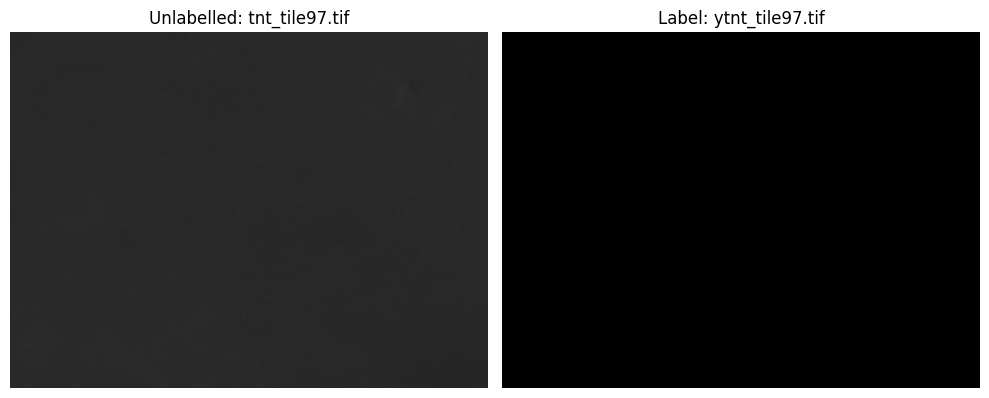

In [8]:
# Plot 25 pairs of corresponding label and non-labelled pictures side by side

import os
import cv2
import matplotlib.pyplot as plt
import random

# Directories containing the images
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'

# Get the lists of filenames
nolabel_files = sorted(os.listdir(nolabel_dir))
label_files = sorted(os.listdir(label_dir))

# Ensure both lists have the same length (or adjust accordingly)
num_samples = len(nolabel_files)
print("Total samples available:", num_samples)

# Randomly choose 25 indices (or fewer if not enough samples)
sample_count = 25
indices = random.sample(range(num_samples), min(sample_count, num_samples))

# Loop over the selected indices and display the corresponding pairs
for idx in indices:
    nl_file = nolabel_files[idx]
    lab_file = label_files[idx]
    nl_path = os.path.join(nolabel_dir, nl_file)
    lab_path = os.path.join(label_dir, lab_file)
    
    # Load the unlabelled image (color image)
    nl_image = cv2.imread(nl_path)
    if nl_image is None:
        print(f"Could not load image: {nl_path}")
        continue
    # Convert from BGR (OpenCV default) to RGB for displaying with matplotlib
    nl_image_rgb = cv2.cvtColor(nl_image, cv2.COLOR_BGR2RGB)
    
    # Load the labelled image (binary mask); load as grayscale for simplicity
    lab_image = cv2.imread(lab_path, cv2.IMREAD_GRAYSCALE)
    if lab_image is None:
        print(f"Could not load image: {lab_path}")
        continue

    # Create a figure with two subplots side by side
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(nl_image_rgb)
    plt.title(f'Unlabelled: {nl_file}')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(lab_image, cmap='gray')
    plt.title(f'Label: {lab_file}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()



# classification model training



- Use cv2.threshold and cv2.dilate to create image masks

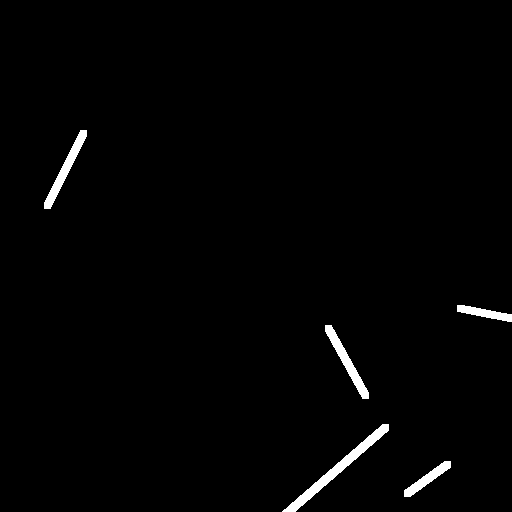

- Use transfer learning to create a classification model for images with and without TNTs
- You can start from and use VGG16
- Your goal is to run as many as models as the types of images you created in the preprocessing step, that is, if you created images of size 512 and 250 pixels, then you will have two models for each image size.

### Define Directories and Make Table

In [9]:
import os
import glob
import pandas as pd
import cv2
import numpy as np

# Directories for your tiles
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'

# Get all tile paths
nolabel_paths = sorted(glob.glob(os.path.join(nolabel_dir, "*.tif")))
label_paths   = sorted(glob.glob(os.path.join(label_dir, "*.tif")))

# Verify both lists have the same length (assuming perfect pairing)
assert len(nolabel_paths) == len(label_paths), \
       "Mismatch between number of nolabel and label tiles."

# Create DataFrame
df = pd.DataFrame({
    "nolabel_path": nolabel_paths,
    "label_path": label_paths
})

def check_mask_has_tnt(label_path):
    """
    Returns 1 if the mask has any foreground pixels (>0), else 0.
    """
    mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        raise ValueError(f"Could not load label image: {label_path}")
    # Check if any pixel is > 0
    return 1 if np.any(mask > 0) else 0
    
df["has_tnt"] = df["label_path"].apply(check_mask_has_tnt)
print(df.sample(15))

                           nolabel_path                         label_path  \
47   ./data/tnt/nolabel/tnt_tile141.tif  ./data/tnt/label/ytnt_tile141.tif   
423  ./data/tnt/nolabel/tnt_tile480.tif  ./data/tnt/label/ytnt_tile480.tif   
427  ./data/tnt/nolabel/tnt_tile484.tif  ./data/tnt/label/ytnt_tile484.tif   
571  ./data/tnt/nolabel/tnt_tile613.tif  ./data/tnt/label/ytnt_tile613.tif   
41   ./data/tnt/nolabel/tnt_tile136.tif  ./data/tnt/label/ytnt_tile136.tif   
322   ./data/tnt/nolabel/tnt_tile39.tif   ./data/tnt/label/ytnt_tile39.tif   
40   ./data/tnt/nolabel/tnt_tile135.tif  ./data/tnt/label/ytnt_tile135.tif   
431  ./data/tnt/nolabel/tnt_tile488.tif  ./data/tnt/label/ytnt_tile488.tif   
446  ./data/tnt/nolabel/tnt_tile500.tif  ./data/tnt/label/ytnt_tile500.tif   
545  ./data/tnt/nolabel/tnt_tile590.tif  ./data/tnt/label/ytnt_tile590.tif   
403  ./data/tnt/nolabel/tnt_tile462.tif  ./data/tnt/label/ytnt_tile462.tif   
244  ./data/tnt/nolabel/tnt_tile319.tif  ./data/tnt/label/ytnt_t

In [10]:
df['has_tnt'].value_counts()

has_tnt
0    561
1     64
Name: count, dtype: int64

### Split the DataFrame into Train/Test Sets

In [11]:
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(df, test_size=0.333, random_state=42, shuffle=True)
print("Training samples:", len(train_df))
print("Validation samples:", len(val_df))


Training samples: 416
Validation samples: 209


### Build Data Generators

In [12]:
import tensorflow as tf
import numpy as np
from PIL import Image
import tensorflow_addons as tfa

# Set up fixed dimensions computed from your tiling logic.
ORIGINAL_HEIGHT, ORIGINAL_WIDTH = 4690, 6278   # original picture dimensions
rows, cols = 25, 25

BORDER = 20
effective_height = ORIGINAL_HEIGHT - 2 * BORDER
effective_width  = ORIGINAL_WIDTH - 2 * BORDER

tile_height = effective_height // rows   # e.g., 930
tile_width  = effective_width // cols      # e.g., 1247

IMG_SIZE = (tile_height, tile_width)   # Fixed size for every image

def load_image_and_mask_fn(nolabel_path_tensor, label_path_tensor):
    """
    Loads an image and its corresponding mask from disk and resizes them to IMG_SIZE.
    """
    nolabel_path_str = nolabel_path_tensor.numpy().decode('utf-8')
    label_path_str   = label_path_tensor.numpy().decode('utf-8')
    
    # Load the RGB image and resize it to IMG_SIZE.
    image = Image.open(nolabel_path_str).convert('RGB')
    image = image.resize(IMG_SIZE, Image.BILINEAR)
    image = np.array(image).astype(np.float32) / 255.0
    
    # Load the mask, convert to grayscale, and resize it.
    mask = Image.open(label_path_str).convert('L')
    mask = mask.resize(IMG_SIZE, Image.NEAREST)
    mask = np.array(mask).astype(np.float32) / 255.0
    mask = (mask > 0.5).astype(np.float32)
    mask = np.expand_dims(mask, axis=-1)
    
    return image, mask

def load_image_and_mask_tf(nolabel_path, label_path):
    image, mask = tf.py_function(
        func=load_image_and_mask_fn,
        inp=[nolabel_path, label_path],
        Tout=[tf.float32, tf.float32]
    )
    # Explicitly force the tensor's shape.
    image = tf.reshape(image, [IMG_SIZE[0], IMG_SIZE[1], 3])
    mask  = tf.reshape(mask,  [IMG_SIZE[0], IMG_SIZE[1], 1])
    # Also set static shape hints.
    image.set_shape([IMG_SIZE[0], IMG_SIZE[1], 3])
    mask.set_shape([IMG_SIZE[0], IMG_SIZE[1], 1])
    return image, mask

def augment_image_and_mask(image, mask, max_angle=45):
    # Random horizontal and vertical flips.
    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)
    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)
    # Random rotation (in radians).
    angle = tf.random.uniform([], -max_angle, max_angle) * (3.14159 / 180)
    image = tfa.image.rotate(image, angle, interpolation='bilinear')
    mask = tfa.image.rotate(mask, angle, interpolation='nearest')
    # Random brightness and contrast.
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    return image, mask

def augment_image_and_mask_tf(image, mask):
    # Force dynamic shape to be exactly IMG_SIZE.
    image = tf.reshape(image, [IMG_SIZE[0], IMG_SIZE[1], 3])
    mask  = tf.reshape(mask,  [IMG_SIZE[0], IMG_SIZE[1], 1])
    image, mask = augment_image_and_mask(image, mask)
    image.set_shape([IMG_SIZE[0], IMG_SIZE[1], 3])
    mask.set_shape([IMG_SIZE[0], IMG_SIZE[1], 1])
    return image, mask

def build_tf_dataset(paths_df, batch_size=2, shuffle=True, augment=False):
    nolabel_list = paths_df["nolabel_path"].values
    label_list   = paths_df["label_path"].values
    
    nolabel_tensor = tf.constant(nolabel_list, dtype=tf.string)
    label_tensor   = tf.constant(label_list, dtype=tf.string)
    
    dataset = tf.data.Dataset.from_tensor_slices((nolabel_tensor, label_tensor))
    if shuffle:
        dataset = dataset.shuffle(len(paths_df))
    
    dataset = dataset.map(load_image_and_mask_tf, num_parallel_calls=tf.data.AUTOTUNE)
    if augment:
        dataset = dataset.map(augment_image_and_mask_tf, num_parallel_calls=tf.data.AUTOTUNE)
    
    dataset = dataset.batch(batch_size, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

# Build training and validation datasets.
train_ds = build_tf_dataset(train_df, batch_size=2, shuffle=True, augment=True)
val_ds   = build_tf_dataset(val_df,   batch_size=2, shuffle=False, augment=False)

# Iterate through some batches to check shapes.
for image, mask in train_ds.take(10):
    print(f"Image shape: {image.shape}, Mask shape: {mask.shape}")


I0000 00:00:1741820632.942733   26014 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 14172 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)
Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)
Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)
Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)
Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)
Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)
Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)
Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)
Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)
Image shape: (2, 186, 249, 3), Mask shape: (2, 186, 249, 1)


2025-03-12 16:03:53.624465: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


### Build the VGG16 Segmentation Model

In [13]:
import tensorflow as tf

########################################
# Custom Metrics
########################################
def precision_m(y_true, y_pred):
    # Resize y_pred to match y_true's spatial dimensions.
    y_pred = tf.image.resize(y_pred, tf.shape(y_true)[1:3], method='bilinear')
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_bin = tf.where(y_pred >= 0.0005, 1.0, 0.0)
    y_pred_f = tf.reshape(y_pred_bin, [-1])
    tp = tf.reduce_sum(y_true_f * y_pred_f)
    pred_pos = tf.reduce_sum(y_pred_f)
    return tp / (pred_pos + 1e-7)

def recall_m(y_true, y_pred):
    # Resize y_pred to match y_true's spatial dimensions.
    y_pred = tf.image.resize(y_pred, tf.shape(y_true)[1:3], method='bilinear')
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_bin = tf.where(y_pred >= 0.0005, 1.0, 0.0)
    y_pred_f = tf.reshape(y_pred_bin, [-1])
    tp = tf.reduce_sum(y_true_f * y_pred_f)
    actual_pos = tf.reduce_sum(y_true_f)
    return tp / (actual_pos + 1e-7)

########################################
# Custom Losses
########################################
import tensorflow as tf

# Standard Dice Loss
@tf.keras.utils.register_keras_serializable(package="MyPackage")
def dice_loss(y_true, y_pred, smooth=1.0):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    dice_coef = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return 1 - dice_coef

# Weighted BCE with margin (adjusted margin)
@tf.keras.utils.register_keras_serializable(package="MyPackage")
def weighted_bce_margin(y_true, y_pred, pos_weight=5.0, margin=5):
    H_pred, W_pred = tf.shape(y_pred)[1], tf.shape(y_pred)[2]
    y_true_resized = tf.image.resize(y_true, [H_pred, W_pred], method='nearest')
    bce_fn = tf.keras.losses.BinaryCrossentropy(from_logits=False,
                                                reduction=tf.keras.losses.Reduction.NONE)
    bce_loss = bce_fn(y_true_resized, y_pred)
    weights = tf.squeeze(y_true_resized, axis=-1) * pos_weight + (1.0 - tf.squeeze(y_true_resized, axis=-1))
    weighted_loss = bce_loss * weights
    if margin > 0:
        weighted_loss = tf.maximum(weighted_loss - margin, 0.0)
    return tf.reduce_mean(weighted_loss)

# Optionally add focal loss if class imbalance is severe.
@tf.keras.utils.register_keras_serializable(package="MyPackage")
def focal_dice_loss(y_true, y_pred, gamma=2.0, alpha=0.25, smooth=1.0):
    # Focal loss component for binary classification.
    epsilon = 1e-7
    y_pred_clipped = tf.clip_by_value(y_pred, epsilon, 1 - epsilon)
    focal_loss = -alpha * tf.pow(1 - y_pred_clipped, gamma) * y_true * tf.math.log(y_pred_clipped) \
                 - (1 - alpha) * tf.pow(y_pred_clipped, gamma) * (1 - y_true) * tf.math.log(1 - y_pred_clipped)
    focal_loss = tf.reduce_mean(focal_loss)
    
    # Dice loss component.
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    dice_coef = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    dice_loss_val = 1 - dice_coef
    
    return focal_loss + dice_loss_val

# For convenience, you can set custom_loss equal to combined_loss.
@tf.keras.utils.register_keras_serializable(package="MyPackage")
def custom_loss(y_true, y_pred):
    return focal_dice_loss(y_true, y_pred)


########################################
# Example Model Compilation
########################################
# After building your model (e.g., model = build_unet_vgg16_tnt_detector(...)), compile it as follows:
#
# model.compile(
#     optimizer=tf.keras.optimizers.Adam(1e-4),
#     loss=combined_loss,  # or custom_loss if you prefer
#     metrics=[precision_m, recall_m]
# )
# model.summary()


In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img

########################################
# 1) Build VGG16 TNT Detector Model
########################################

import tensorflow as tf
from tensorflow.keras.layers import Conv2DTranspose, Concatenate, Conv2D, Dropout
from tensorflow.keras.models import Model

@tf.keras.utils.register_keras_serializable()
class CropToTarget(tf.keras.layers.Layer):
    def call(self, inputs):
        skip_tensor, target_tensor = inputs
        s_shape = tf.shape(skip_tensor)
        t_shape = tf.shape(target_tensor)
        height_diff = s_shape[1] - t_shape[1]
        width_diff = s_shape[2] - t_shape[2]
        crop_top = height_diff // 2
        crop_bottom = height_diff - crop_top
        crop_left = width_diff // 2
        crop_right = width_diff - crop_left
        return skip_tensor[:, crop_top : s_shape[1]-crop_bottom,
                           crop_left : s_shape[2]-crop_right, :]

def build_unet_vgg16_tnt_detector(input_shape=(tile_height, tile_width, 3), num_classes=1):
    base_model = tf.keras.applications.VGG16(
        weights='imagenet', include_top=False, input_shape=input_shape
    )
    # Unfreeze block4 and block5 for fine-tuning.
    for layer in base_model.layers:
        if layer.name.startswith("block5") or layer.name.startswith("block4"):
            layer.trainable = True
        else:
            layer.trainable = False

    skip1 = base_model.get_layer("block1_conv2").output
    skip2 = base_model.get_layer("block2_conv2").output
    skip3 = base_model.get_layer("block3_conv3").output
    skip4 = base_model.get_layer("block4_conv3").output
    bottleneck = base_model.get_layer("block5_conv3").output

    d1 = Conv2DTranspose(512, (3,3), strides=(2,2), padding='same')(bottleneck)
    skip4_cropped = CropToTarget()([skip4, d1])
    d1 = Concatenate()([d1, skip4_cropped])
    d1 = Conv2D(512, (3,3), activation='relu', padding='same')(d1)
    d1 = Dropout(0.3)(d1)

    d2 = Conv2DTranspose(256, (3,3), strides=(2,2), padding='same')(d1)
    skip3_cropped = CropToTarget()([skip3, d2])
    d2 = Concatenate()([d2, skip3_cropped])
    d2 = Conv2D(256, (3,3), activation='relu', padding='same')(d2)
    d2 = Dropout(0.3)(d2)

    d3 = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same')(d2)
    skip2_cropped = CropToTarget()([skip2, d3])
    d3 = Concatenate()([d3, skip2_cropped])
    d3 = Conv2D(128, (3,3), activation='relu', padding='same')(d3)
    d3 = Dropout(0.2)(d3)

    d4 = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same')(d3)
    skip1_cropped = CropToTarget()([skip1, d4])
    d4 = Concatenate()([d4, skip1_cropped])
    d4 = Conv2D(64, (3,3), activation='relu', padding='same')(d4)

    d5 = Conv2DTranspose(32, (3,3), strides=(2,2), padding='same')(d4)
    d5 = Conv2D(32, (3,3), activation='relu', padding='same')(d5)

    outputs = Conv2D(num_classes, (1,1), activation='sigmoid')(d5)

    model = Model(inputs=base_model.input, outputs=outputs)
    return model

# Build and compile the model with the new loss and metrics.
input_shape = (tile_height, tile_width, 3)
model = build_unet_vgg16_tnt_detector(input_shape=input_shape)
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=focal_dice_loss,  # using the new combined focal+Dice loss
    metrics=[precision_m, recall_m]
)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 186, 249,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 186, 249,  │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 186, 249,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 93, 124,   │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 93, 124,   │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 93, 124,   │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 46, 62,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 46, 62,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 46, 62,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 46, 62,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 23, 31,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 23, 31,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 23, 31,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 23, 31,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 11, 15,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 11, 15,    │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 11, 15,    │  2,359,808 │ block5_conv1[0][

 Total params: 24,918,817 (95.06 MB)

 Trainable params: 23,183,329 (88.44 MB)

 Non-trainable params: 1,735,488 (6.62 MB)

### Compile the Model

### Compile and Train The Model

In [15]:
########################################
# 4) Compile and Train
########################################
model = build_unet_vgg16_tnt_detector(input_shape=(tile_height, tile_width, 3))
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=weighted_bce_margin,  # Use our new loss function
    metrics=[precision_m, recall_m]
)
model.summary()

# Then continue with your training:
EPOCHS = 50
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=5, restore_best_weights=True
)
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[early_stop]
)
model.save("./models/vgg16_tnt.keras")

# Evaluate
val_loss, val_precision, val_recall = model.evaluate(val_ds)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Precision: {val_precision:.4f}")
print(f"Validation Recall: {val_recall:.4f}")

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 186, 249,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 186, 249,  │      1,792 │ input_layer_1[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 186, 249,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 93, 124,   │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 93, 124,   │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 93, 124,   │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 46, 62,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 46, 62,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 46, 62,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 46, 62,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 23, 31,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 23, 31,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 23, 31,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 23, 31,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 11, 15,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 11, 15,    │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 11, 15,    │  2,359,808 │ block5_conv1[0][

 Total params: 24,918,817 (95.06 MB)

 Trainable params: 23,183,329 (88.44 MB)

 Non-trainable params: 1,735,488 (6.62 MB)

Epoch 1/50


I0000 00:00:1741820637.089633   26119 service.cc:148] XLA service 0x2a543250 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1741820637.089660   26119 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3080 Laptop GPU, Compute Capability 8.6
2025-03-12 16:03:57.175484: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1741820637.536879   26119 cuda_dnn.cc:529] Loaded cuDNN version 90701


  2/208 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 4.9716e-04 - precision_m: 0.0013 - recall_m: 0.2500         

I0000 00:00:1741820646.831273   26119 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


208/208 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 7.1602e-05 - precision_m: 0.0021 - recall_m: 0.1872 - val_loss: 6.9946e-09 - val_precision_m: 0.0013 - val_recall_m: 0.1538
Epoch 2/50
208/208 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 1.0229e-07 - precision_m: 0.0029 - recall_m: 0.2267 - val_loss: 0.0000e+00 - val_precision_m: 0.0013 - val_recall_m: 0.1538
Epoch 3/50
208/208 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 2.3517e-09 - precision_m: 0.0025 - recall_m: 0.1940 - val_loss: 0.0000e+00 - val_precision_m: 0.0013 - val_recall_m: 0.1538
Epoch 4/50
208/208 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 3.3470e-09 - precision_m: 0.0022 - recall_m: 0.2042 - val_loss: 0.0000e+00 - val_precision_m: 0.0013 - val_recall_m: 0.1538
Epoch 5/50
208/208 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 1.4303e-08 - precision_m: 0.0019 - recall_m: 0.1725 - val_loss: 0.0000e+00 - val_precision_m: 0.0013 - val_recall_m: 0.1538
Epoch 6/50
208/208 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - loss: 2.8889e-09 - precis

### Evaluate the Model

In [16]:
val_results = model.evaluate(val_ds)
print(dict(zip(model.metrics_names, val_results)))

104/104 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0000e+00 - precision_m: 0.0011 - recall_m: 0.1300        
{'loss': 0.0, 'compile_metrics': 0.0013454356230795383}


### See Results

Total samples available: 625
Model expects input size: (186, 249)
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


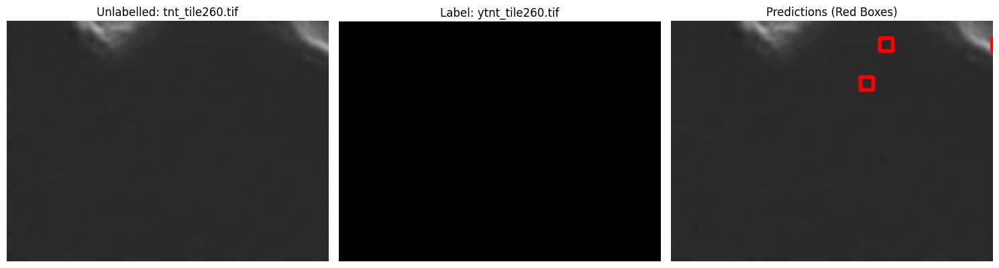

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


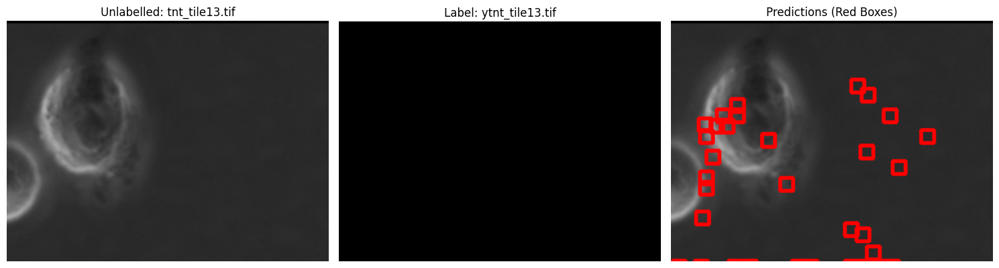

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


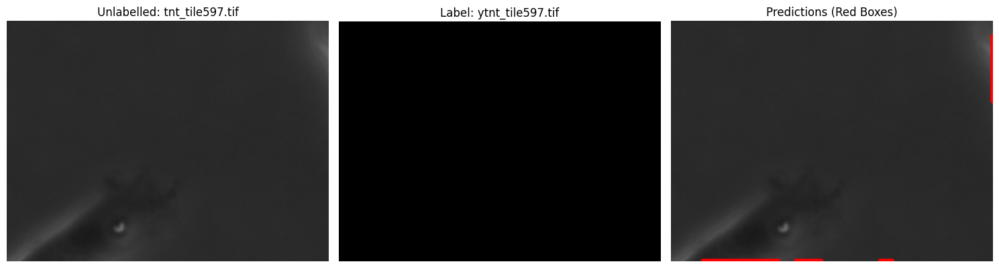

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


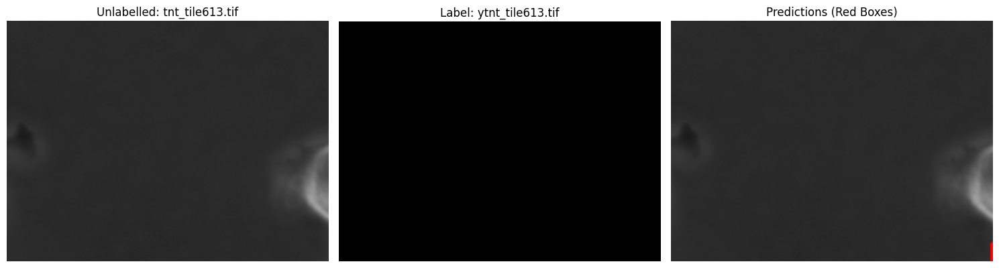

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


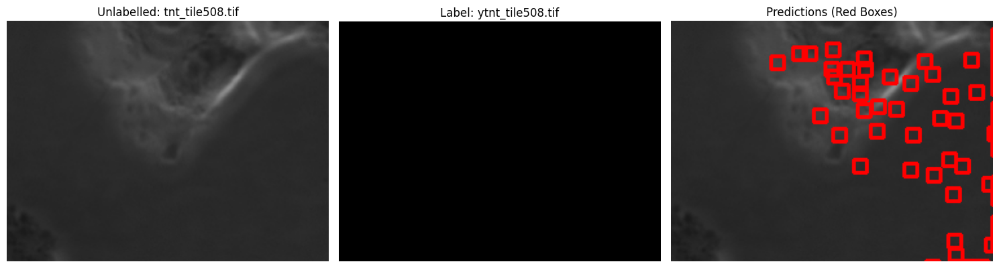

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


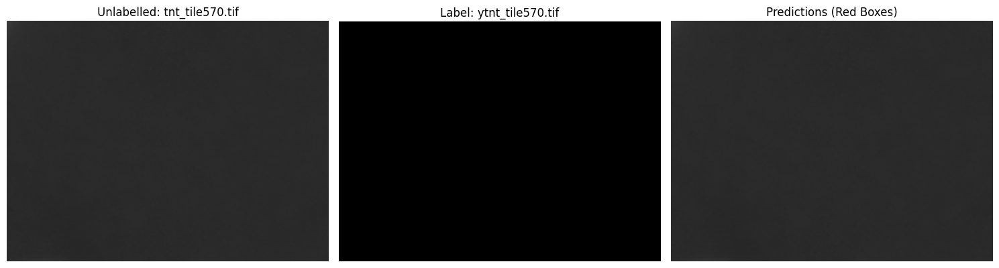

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


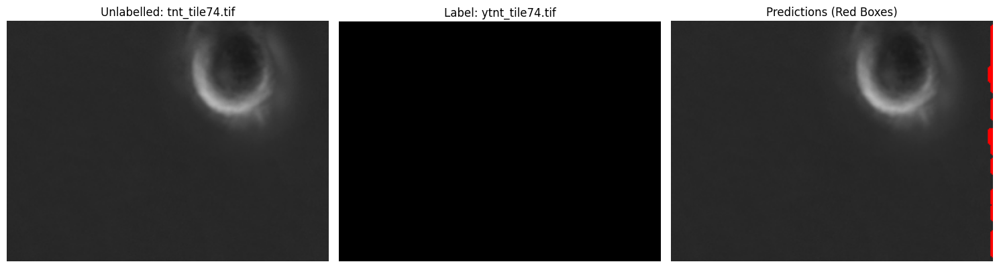

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


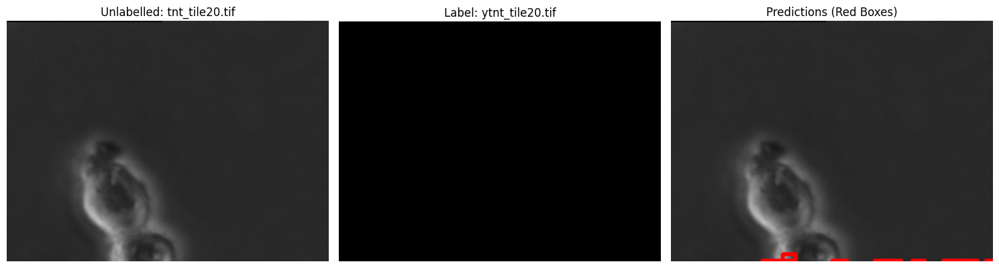

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


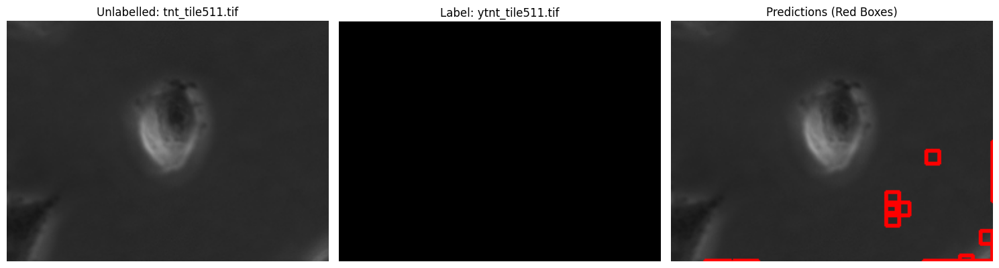

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


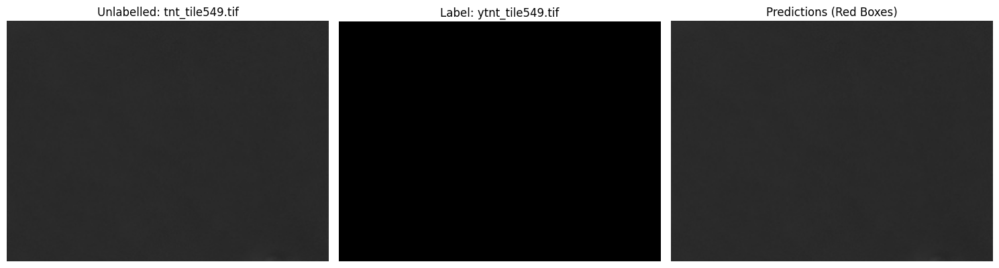

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


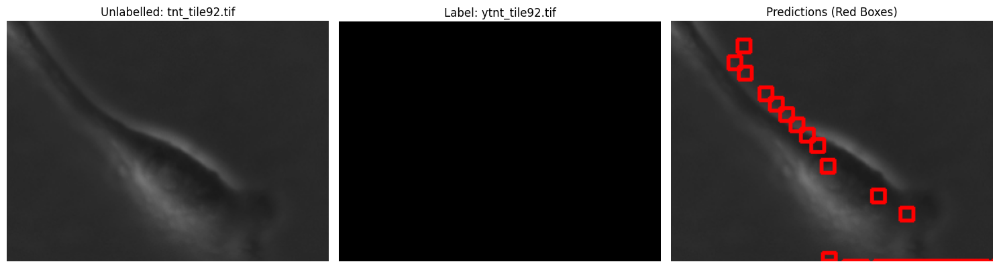

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


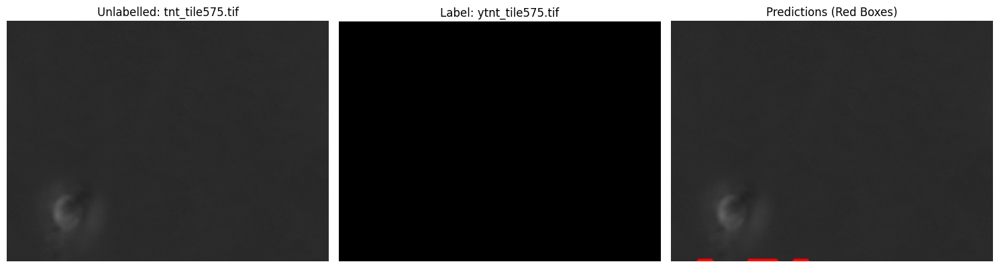

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


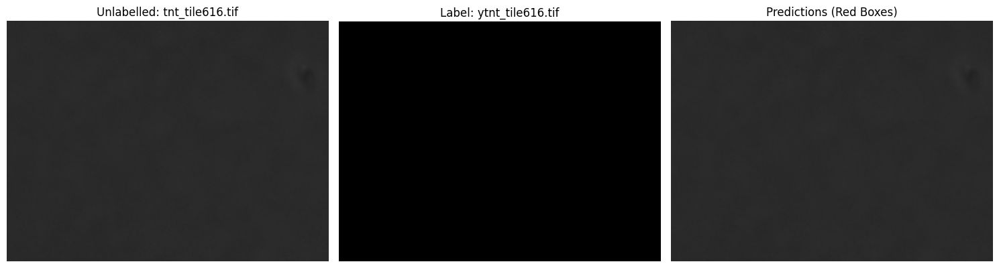

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


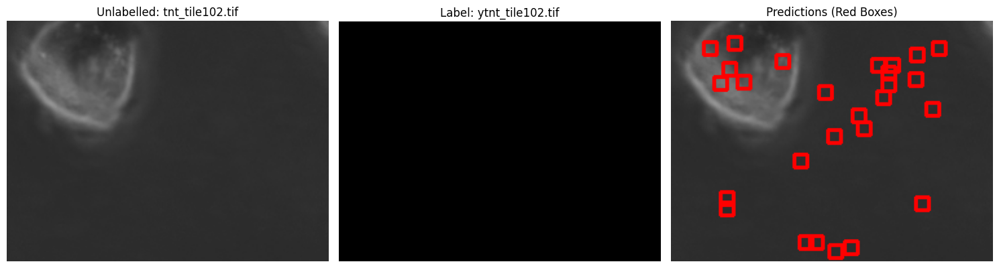

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


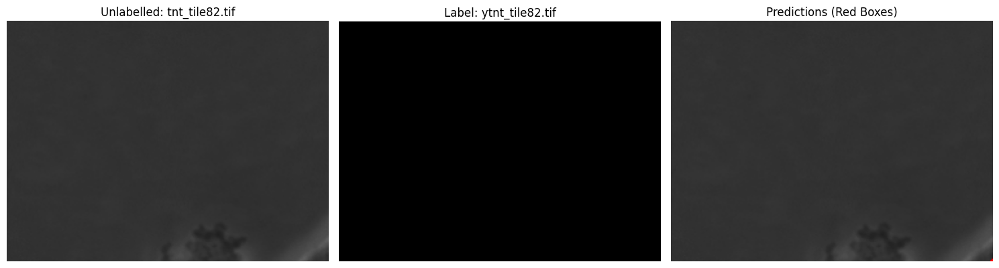

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


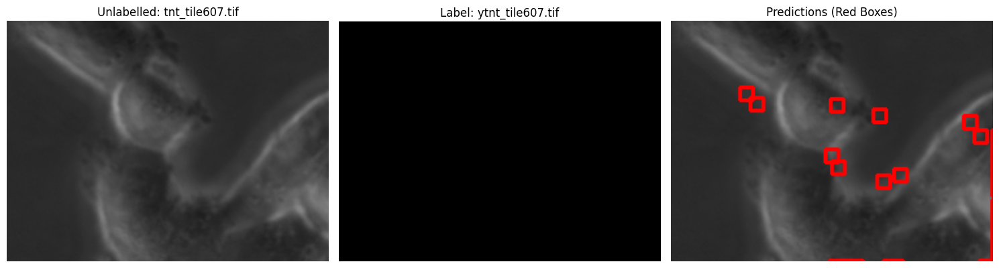

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


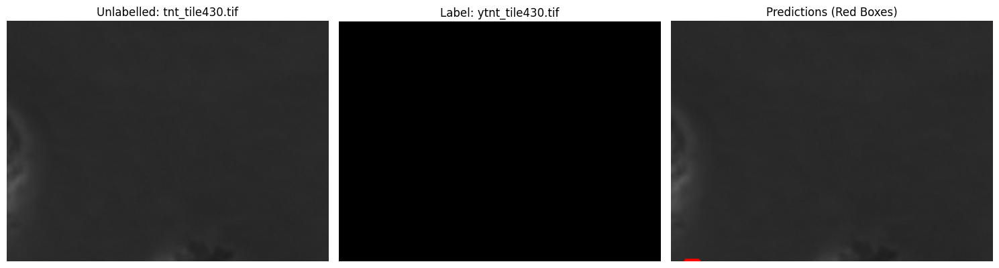

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


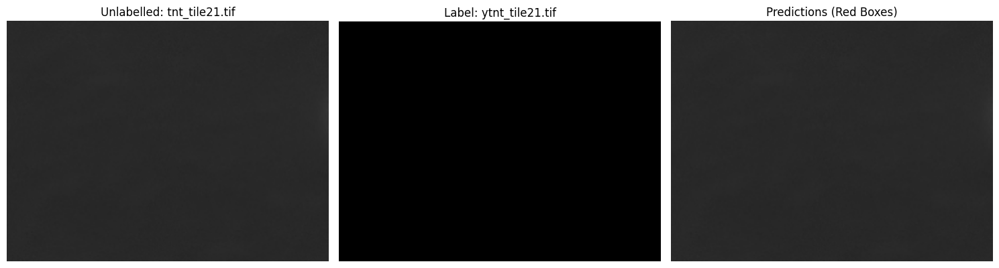

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


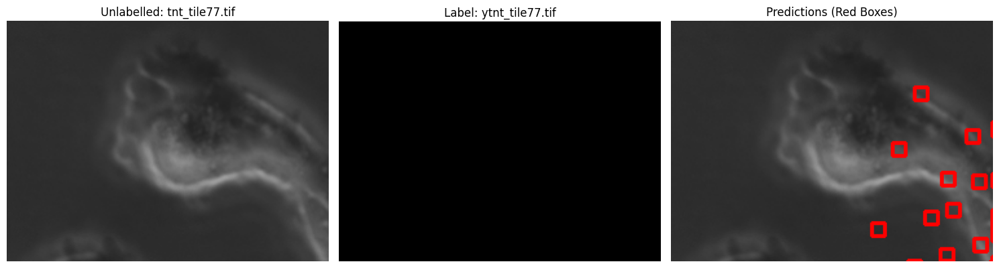

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


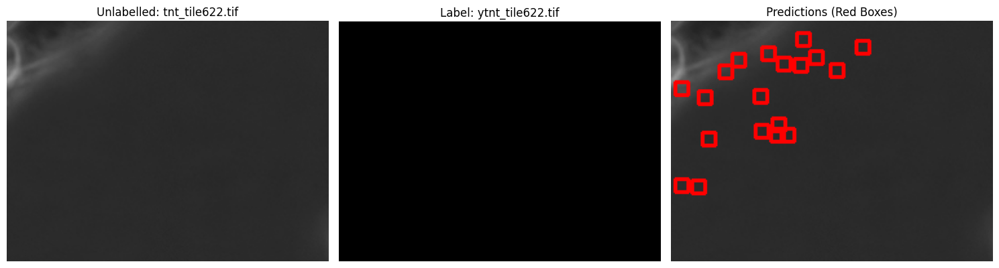

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


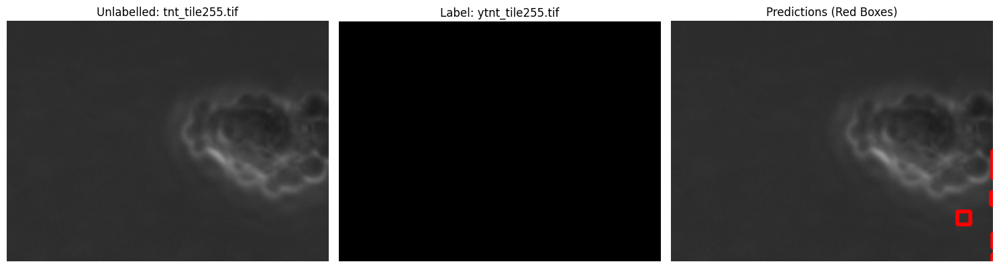

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


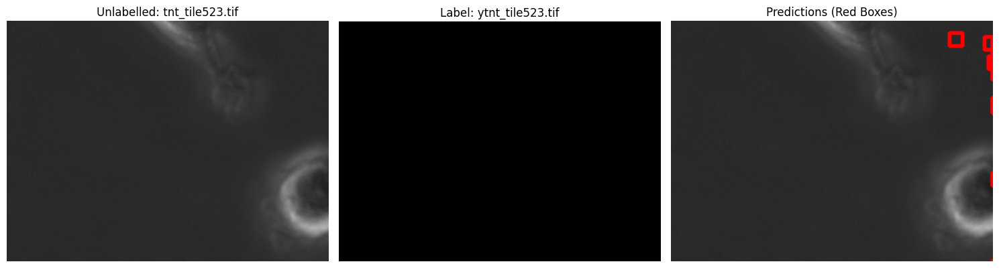

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


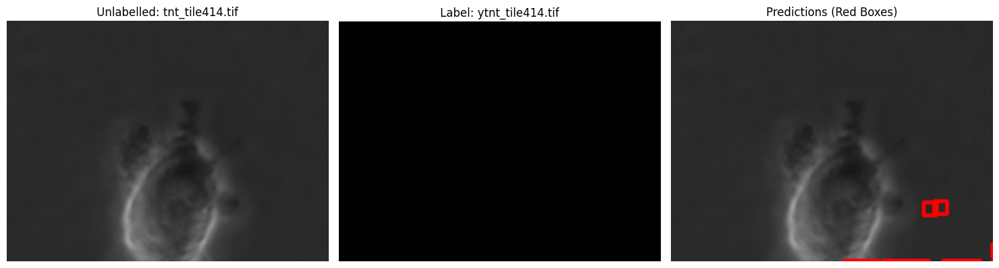

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


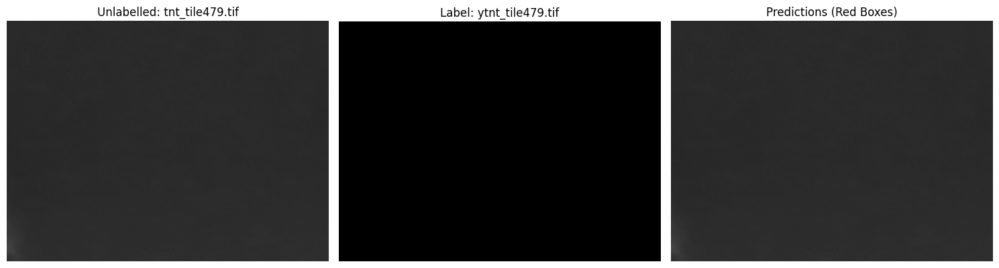

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


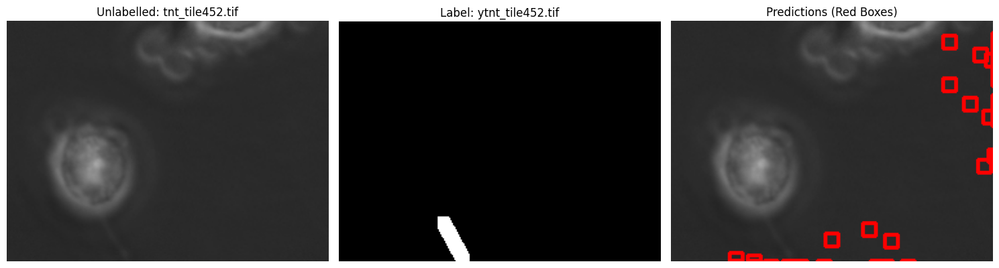

In [17]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Assume the following variables are defined elsewhere:
# - model_infer: your loaded inference model.
# - IMG_SIZE: the expected size of each tile, e.g., (930, 1247)

model_infer = tf.keras.models.load_model(
    "./models/vgg16_tnt.keras",
    custom_objects={
        "custom_loss": custom_loss, 
        "precision_m": precision_m,
        "recall_m": recall_m,
        "weighted_bce_margin": weighted_bce_margin  
    },
    safe_mode=False
)


# Directories containing the images
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'

# Get the lists of filenames
nolabel_files = sorted(os.listdir(nolabel_dir))
label_files = sorted(os.listdir(label_dir))

num_samples = len(nolabel_files)
print("Total samples available:", num_samples)

# Randomly choose 25 indices (or fewer if not enough samples)
sample_count = 25
indices = random.sample(range(num_samples), min(sample_count, num_samples))

# Function to draw fixed-size red boxes on an image given a predicted mask.
def draw_prediction_boxes(image, pred_mask, threshold=0.01, box_size=10):
    """
    image: original image in RGB (numpy array, [H, W, 3], values 0-255)
    pred_mask: prediction output from the model (assumed single-channel, float values)
    threshold: threshold to binarize the prediction.
    box_size: size of the square box to draw.
    """
    # Convert predicted mask to binary (0 or 255)
    pred_bin = (pred_mask > threshold).astype(np.uint8) * 255
    # Convert to grayscale if needed
    if len(pred_bin.shape) == 3 and pred_bin.shape[-1] > 1:
        pred_bin = cv2.cvtColor(pred_bin, cv2.COLOR_BGR2GRAY)
    
    # Optionally, apply a morphological closing to clean up the mask
    kernel = np.ones((3, 3), np.uint8)
    pred_bin = cv2.morphologyEx(pred_bin, cv2.MORPH_CLOSE, kernel)
    
    # Find contours in the binary mask
    contours, _ = cv2.findContours(pred_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Copy the original image to draw on
    image_with_boxes = image.copy()
    half_box = box_size // 2
    
    for cnt in contours:
        # Filter out very small contours (noise)
        if cv2.contourArea(cnt) < 10:
            continue
        # Compute the centroid of the contour
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
        else:
            continue
        
        # Define top-left and bottom-right points for a fixed box around the centroid
        top_left = (max(cx - half_box, 0), max(cy - half_box, 0))
        bottom_right = (min(cx + half_box, image.shape[1]-1), min(cy + half_box, image.shape[0]-1))
        
        # Draw the box in red (BGR: (0,0,255)); since image is RGB, convert accordingly.
        # We can draw directly using cv2.rectangle but then convert color ordering if needed.
        cv2.rectangle(image_with_boxes, top_left, bottom_right, (255, 0, 0), thickness=2)
    
    return image_with_boxes

# Get expected input size from the loaded model (excluding batch dimension)
expected_h, expected_w = model_infer.input_shape[1:3]
print(f"Model expects input size: ({expected_h}, {expected_w})")

# Loop over the selected indices and display three columns: Unlabelled, Label, Predictions.
for idx in indices:
    nl_file = nolabel_files[idx]
    lab_file = label_files[idx]
    nl_path = os.path.join(nolabel_dir, nl_file)
    lab_path = os.path.join(label_dir, lab_file)
    
    # Load the unlabelled tile (color image)
    nl_image = cv2.imread(nl_path)
    if nl_image is None:
        print(f"Could not load image: {nl_path}")
        continue
    # Convert from BGR to RGB for display and prediction (assuming model_infer expects RGB)
    nl_image_rgb = cv2.cvtColor(nl_image, cv2.COLOR_BGR2RGB)
    
    # Resize tile to match the model's expected input size
    nl_image_resized = cv2.resize(nl_image_rgb, (expected_w, expected_h))
    
    # Load the labelled image (binary mask); load as grayscale for simplicity
    lab_image = cv2.imread(lab_path, cv2.IMREAD_GRAYSCALE)
    if lab_image is None:
        print(f"Could not load image: {lab_path}")
        continue
    
    # --- Run inference on the unlabelled tile ---
    # Normalize image for model input (values in [0, 1])
    nl_image_norm = nl_image_resized.astype(np.float32) / 255.0
    # Expand dims to add a batch dimension
    tile_input = np.expand_dims(nl_image_norm, axis=0)
    # Predict mask (model_infer should output a mask of shape [1, H, W, 1] or similar)
    pred_mask = model_infer.predict(tile_input)
    # Remove batch dimension and squeeze to single channel if needed
    pred_mask = np.squeeze(pred_mask)
    threshold = np.percentile(pred_mask, 90) # adjust here ****
    
    # --- Draw red boxes on the unlabelled tile ---
    # Make a copy of the original (resized) image in uint8 range to draw boxes
    nl_image_uint8 = nl_image_resized.copy()
    pred_with_boxes = draw_prediction_boxes(nl_image_uint8, pred_mask, threshold=threshold, box_size=10)
    
    # --- Plot results: 3 columns: Unlabelled, Label, Predictions ---
    plt.figure(figsize=(15, 5))
    
    # Column 1: Unlabelled tile (resized)
    plt.subplot(1, 3, 1)
    plt.imshow(nl_image_resized)
    plt.title(f'Unlabelled: {nl_file}')
    plt.axis('off')
    
    # Column 2: Label (ground-truth mask)
    plt.subplot(1, 3, 2)
    plt.imshow(lab_image, cmap='gray')
    plt.title(f'Label: {lab_file}')
    plt.axis('off')
    
    # Column 3: Predictions (with red boxes)
    plt.subplot(1, 3, 3)
    plt.imshow(pred_with_boxes)
    plt.title('Predictions (Red Boxes)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
